In [223]:
from os import listdir, mkdir
from os.path import isfile, join, isdir
from json import loads
from re import findall,UNICODE
import sys
sys.path.append("/Users/andyreagan/tools/python")
from kitchentable.dogtoys import *
from labMTsimple.labMTsimple.speedy import LabMT
my_LabMT = LabMT()
from labMTsimple.labMTsimple.storyLab import *
import numpy as np
import pickle

import os
sys.path.append('/Users/andyreagan/projects/2014/09-books/database')
os.environ.setdefault('DJANGO_SETTINGS_MODULE','gutenbergdb.settings')
import django
django.setup()

from library.models import *
from bookclass import *

from tqdm import tqdm,trange

In [224]:
# all our essentials
from matplotlib import rc,rcParams
# rc('font', family='sans-serif') 
# rc('font', serif='Helvetica Neue')
# rc('text', usetex='false') 

rc('font', family='serif')
rc('font', family='cmr10')
rc('text', usetex='true') 

rcParams.update({'font.size': 12})
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.colors import rgb2hex
from matplotlib.patches import Rectangle,BoxStyle,FancyBboxPatch
%matplotlib inline

In [225]:
# from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import TruncatedSVD
from sklearn import metrics
from scipy.spatial.distance import pdist,squareform
from scipy.cluster.hierarchy import dendrogram,linkage
from scipy.misc import comb

In [226]:
filters = {"min_dl":40,
           "length": [20000,100000],
           "P": True,
           "n_points": 200,
           "salad": False,
          }
q = get_books(Book,filters)
version_str = get_version_str(filters)
this_dir = join("/Users/andyreagan/projects/2014/09-books/media/figures/clustering",version_str)
if not isdir(this_dir):
    mkdir(this_dir)
big_matrix = get_data(q,version_str,filters,use_cache=True)
big_matrix_mean0 = big_matrix-np.tile(big_matrix.mean(axis=1),(200,1)).transpose()
big_matrix_start0 = big_matrix-np.tile(big_matrix[:,0],(200,1)).transpose()
print(big_matrix.shape)

(1327, 200)


In [227]:
# pre compute the full distance matrix
# ouch

# the city block distance betwen two vectors
def cityBlock(a,b):
    return np.sum(np.abs(a-b))

# define a quick cache for this one...
if isfile("/Users/andyreagan/projects/2014/09-books/data/gutenberg/pairwise-distance-matrix-cache-{}.p".format(version_str)):
    allDistances = pickle.load(open("/Users/andyreagan/projects/2014/09-books/data/gutenberg/pairwise-distance-matrix-cache-{}.p".format(version_str),"rb"))
    allDistancesCentered = pickle.load(open("/Users/andyreagan/projects/2014/09-books/data/gutenberg/pairwise-distance-mean0-matrix-cache-{}.p".format(version_str),"rb"))
    allDistancesStart = pickle.load(open("/Users/andyreagan/projects/2014/09-books/data/gutenberg/pairwise-distance-start0-matrix-cache-{}.p".format(version_str),"rb"))
else:
    pairWiseDistances = np.zeros([big_matrix.shape[0],big_matrix.shape[0]])
    pairWiseDistancesCentered = np.zeros([big_matrix_mean0.shape[0],big_matrix_mean0.shape[0]])
    pairWiseDistancesStart = np.zeros([big_matrix_start0.shape[0],big_matrix_start0.shape[0]])
    for i in range(big_matrix.shape[0]):
        if i%100 == 0:
            print(i)
        # compute only the upper diagonal
        for j in range(i,big_matrix.shape[0]):
            pairWiseDistances[i,j] = cityBlock(big_matrix[i,:],big_matrix[j,:])
            pairWiseDistancesCentered[i,j] = cityBlock(big_matrix_mean0[i,:],big_matrix_mean0[j,:])
            pairWiseDistancesStart[i,j] = cityBlock(big_matrix_start0[i,:],big_matrix_start0[j,:])
    # build the full matrices
    allDistances = pairWiseDistances+np.transpose(pairWiseDistances)
    allDistancesCentered = pairWiseDistancesCentered+np.transpose(pairWiseDistancesCentered)
    allDistancesStart = pairWiseDistancesStart+np.transpose(pairWiseDistancesStart)
    pickle.dump(allDistances,open("/Users/andyreagan/projects/2014/09-books/data/gutenberg/pairwise-distance-matrix-cache-{}.p".format(version_str),"wb"),pickle.HIGHEST_PROTOCOL)
    pickle.dump(allDistancesCentered,open("/Users/andyreagan/projects/2014/09-books/data/gutenberg/pairwise-distance-mean0-matrix-cache-{}.p".format(version_str),"wb"),pickle.HIGHEST_PROTOCOL)
    pickle.dump(allDistancesStart,open("/Users/andyreagan/projects/2014/09-books/data/gutenberg/pairwise-distance-start0-matrix-cache-{}.p".format(version_str),"wb"),pickle.HIGHEST_PROTOCOL)

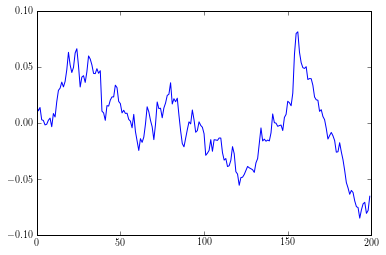

In [269]:
plt.plot(big_matrix_mean0[0,:])

In [229]:
big_matrix_mean0Normalized = big_matrix_mean0*np.tile((1/np.max(np.abs(big_matrix_mean0),axis=1)),(200,1)).transpose()

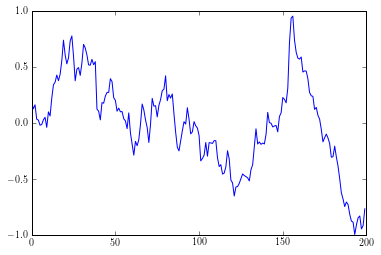

In [230]:
plt.plot(big_matrix_mean0Normalized[0,:])

In [288]:
data = big_matrix_mean0Normalized
subplot_ylim = .9
data = big_matrix_mean0
subplot_ylim = .2

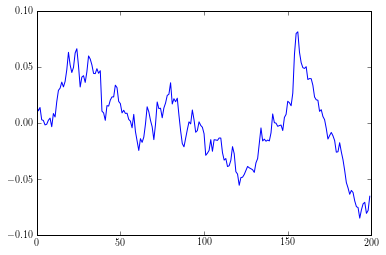

In [270]:
plt.plot(data[0,:])

In [233]:
method = 'ward'
metric = 'euclidean'
# method = 'median'
# metric = 'euclidean'
# method = 'centroid'
# metric = 'euclidean'
# method = "complete"
# metric = "cityblock"
# method = "single"
# metric = "cityblock"
# method = "average"
# metric = "cityblock"

# fit = linkage(allDistancesCentered,metric=metric,method=method)
# fit = linkage(big_matrix_mean0,metric=metric,method=method)
fit = linkage(data,metric=metric,method=method)
distances = pdist(data, metric)

In [234]:
len(distances)

879801

In [235]:
distances[:10]

array([ 0.75423232,  1.74979558,  1.69810963,  3.93118121,  1.64768095,
        3.7654515 ,  1.39321908,  2.00898282,  1.84193259,  1.4032924 ])

In [236]:
data.shape[0]

1327

In [237]:
(data.shape[0]**2-data.shape[0])/2

879801.0

so the storage in distances doesn't actually include the diagonal (of course, it says it's the 

In [238]:
# let's try to understand this matrix fit
# A 4 by (n-1) matrix Z is returned.
print(data.shape)
print(fit.shape)
print("this is (n-1) by 4, as expected")
print("-"*20)

# At the i-th iteration, clusters with indices Z[i, 0] and Z[i, 1] 
# are combined to form cluster n + i.
print("...so at iteration n+i, fit[-1,:] we find:")
print(fit[-1,:])
print("-"*20)
# old indices:
# this means clusters 6152 and 6153 were combined to form cluster 3077+3077=6154
# new indices?
# this means clusters fit[-1,0] and fit[-1,1] were combined to form cluster 1755+1755=3510

# A cluster with an index less than n corresponds to one of the original observations.
#...so cluster 0, cluster 3000 are the books at 0, and 3000, themselves

# The distance between clusters Z[i, 0] and Z[i, 1] is given by Z[i, 2].
# ...so the distance between clusters 6152 and 6153 is 72466

# The fourth value Z[i, 3] represents the number of original observations in the newly formed cluster.
# ...and, we now have all of the books in that cluster

print(fit[0,:])
print(fit[1,:])
print("...")
print(fit[-2,:])
print(fit[-1,:])

(1327, 200)
(1326, 4)
this is (n-1) by 4, as expected
--------------------
...so at iteration n+i, fit[-1,:] we find:
[ 2650.          2651.            30.96587552  1327.        ]
--------------------
[ 241.  331.    0.    2.]
[  2.34000000e+02   3.28000000e+02   1.72706481e-03   2.00000000e+00]
...
[ 2645.          2647.            25.53682015   653.        ]
[ 2650.          2651.            30.96587552  1327.        ]


In [239]:
1384+1385

2769

In [240]:
def get_cluster_from_t(t):
    i = np.where(fit[:,2] == t)
    # return i[0][0]
    return i[0][0]+data.shape[0]
print(get_cluster_from_t(fit[0,2]))
print(get_cluster_from_t(fit[-1,2]))

1327
2652


In [241]:
data.shape[0]

1327

In [242]:
# define a threshold
threshold = 70000
# and we'll go get all of the clusters that are merged under that threshold
# ...this has the effect of slicing the dendrogram at any height

def get_cluster_indices(model,threshold=70000,return_cluster_names=False):
    cluster_list = np.array([i for i in range(data.shape[0])])
    for i,merge in enumerate(model):
        if merge[2] < threshold:
            # print(merge)
            # print(int(merge[0]))
            a = cluster_list==int(merge[0])
            cluster_list[cluster_list==int(merge[0])] = i+data.shape[0]
            cluster_list[cluster_list==int(merge[1])] = i+data.shape[0]
    # print(cluster_list[:10])
    # print(cluster_list[1730:1740])
    clusters = np.unique(cluster_list)
    a = np.arange(data.shape[0])
    indices = [a[cluster_list==c] for c in clusters]
    num_clusters = len(indices)
    cluster_sizes = list(map(len,indices))
    # print('found {0} clusters of sizes:'.format(num_clusters))
    # print(cluster_sizes)
    if return_cluster_names:
        return indices,num_clusters,cluster_sizes,cluster_list
    else:
        return indices,num_clusters,cluster_sizes
    
def get_cluster_indices_from_id(model,cluster_id):
    if cluster_id < data.shape[0]:
        return np.array([cluster_id])
    if cluster_id == (data.shape[0]*2-1):
        return np.arange(data.shape[0])
    cluster_list = np.array([i for i in range(data.shape[0])])
    for i,merge in enumerate(model):
        if merge[2] <= model[cluster_id-data.shape[0],2]:
            # print(merge)
            # print(int(merge[0]))
            a = cluster_list==int(merge[0])
            cluster_list[cluster_list==int(merge[0])] = i+data.shape[0]
            cluster_list[cluster_list==int(merge[1])] = i+data.shape[0]
    a = np.arange(data.shape[0])
    # print(cluster_list)
    indices = a[cluster_list==cluster_id]
    return indices

ind,nc,cs = get_cluster_indices(fit,threshold=5000)
ind,nc,cs,cluster_list = get_cluster_indices(fit,threshold=5000,return_cluster_names=True)

In [243]:
def get_cluster_indices3(model,threshold):
    cluster_list = np.arange(data.shape[0],dtype=int)
    # march through the model and cluster the stories as they are clustered in each step of model
    i = 0
    merge = model[i]
    while merge[2] < threshold:
        # print(i,merge)
        # print(int(merge[0]))
        a = cluster_list==int(merge[0])
        cluster_list[cluster_list==int(merge[0])] = i+data.shape[0]
        cluster_list[cluster_list==int(merge[1])] = i+data.shape[0]
        i+=1
        if i == len(model):
            break
        merge = model[i]
    return cluster_list

In [244]:
sil_x = np.linspace(fit[-1][2]-fit[-1][2]/100,fit[-1][2]/100,100)
print(sil_x)
sil_vals = np.zeros(len(sil_x))
for i in trange(len(sil_x)):
    # print(i)
    cluster_indices = get_cluster_indices3(fit,sil_x[i])
    # print(cluster_indices)
    sil_vals[i] = metrics.silhouette_score(data, cluster_indices, metric=metric)  
# y = [metrics.silhouette_score(data, get_cluster_indices3(fit,i), metric=metrix) for i in x]

100%|██████████| 100/100 [02:02<00:00, 13.66s/it]

[ 30.65621677  30.34968588  30.04315499  29.7366241   29.43009321
  29.12356232  28.81703143  28.51050054  28.20396966  27.89743877
  27.59090788  27.28437699  26.9778461   26.67131521  26.36478432
  26.05825343  25.75172254  25.44519165  25.13866076  24.83212988
  24.52559899  24.2190681   23.91253721  23.60600632  23.29947543
  22.99294454  22.68641365  22.37988276  22.07335187  21.76682099
  21.4602901   21.15375921  20.84722832  20.54069743  20.23416654
  19.92763565  19.62110476  19.31457387  19.00804298  18.7015121
  18.39498121  18.08845032  17.78191943  17.47538854  17.16885765
  16.86232676  16.55579587  16.24926498  15.94273409  15.63620321
  15.32967232  15.02314143  14.71661054  14.41007965  14.10354876
  13.79701787  13.49048698  13.18395609  12.8774252   12.57089432
  12.26436343  11.95783254  11.65130165  11.34477076  11.03823987
  10.73170898  10.42517809  10.1186472    9.81211631   9.50558543
   9.19905454   8.89252365   8.58599276   8.27946187   7.97293098
   7.666400

In [279]:
def get_cluster_indices2(model,threshold=70000):
    cluster_list = get_cluster_indices3(model,threshold=threshold)
        
    # print(cluster_list[:10])
    # print(cluster_list[1730:1740])
    clusters = np.unique(cluster_list)
    a = np.arange(data.shape[0],dtype=int)
    indices = [a[cluster_list==c] for c in clusters]
    # num_clusters = len(indices)
    # cluster_sizes = list(map(len,indices))
    # print('found {0} clusters of sizes:'.format(num_clusters))
    # print(cluster_sizes)
    return indices,cluster_list

def ij_in_cdm(i,j):
    return comb(data.shape[0],2) - comb(data.shape[0]-i,2) + (j-i-1)
    

def get_sorted(all_ind):
    # go get the submatrix
    # data[[1,2,3],:][:,[1,2,3]]
    # submat = allDistances[all_ind,:][:,all_ind]
    # # print(submat)
    # distances = submat.sum(axis=0)
    # print(distances)
    # avg_distances = np.array([np.mean([distances[int(ij_in_cdm(i,j))] for j in all_ind if j != i]) for i in all_ind])
    # cluster_mean = data[ind,:].mean(axis=0)
    # print(data[all_ind,:].mean(axis=0))
    # print(data[all_ind,:])
    cluster_mean_and_arcs = np.vstack((data[all_ind,:].mean(axis=0),data[all_ind,:])) # ,axis=0
    # print(cluster_mean_and_arcs)
    avg_distances = pdist(cluster_mean_and_arcs,metric=metric)[:len(all_ind)]
    indices_sorted = sorted(np.arange(len(all_ind),dtype="i"),key=lambda i: avg_distances[i],reverse=False)
    all_ind_sorted = all_ind[indices_sorted]
    distances_sorted = avg_distances[indices_sorted]
    # print(all_ind_sorted)
    # make sure they're sorted the right way!
    # print(distances_sorted)
    # assert distances_sorted[0] < distances_sorted[1]
    titles_sorted = ["" for i in range(len(all_ind_sorted))]
    chars = 50
    for i,ind in enumerate(all_ind_sorted):
        b = q[int(ind)]
        if len(b.title) > chars:
            titles_sorted[i] = "{}. {}...".format(i+1,b.title[:chars-3].replace("\n",": "))
        else:
            titles_sorted[i] = "{}. {}".format(i+1,b.title.replace("\n",": "))
    return all_ind_sorted,titles_sorted

In [285]:
get_sorted(np.arange(10))

(array([3, 0, 1, 5, 7, 2, 9, 8, 6, 4]),
 ['1. The Song of Hiawatha',
  "2. Alice's Adventures in Wonderland",
  '3. Through the Looking-Glass',
  '4. O Pioneers!',
  '5. Herland',
  '6. Peter Pan',
  '7. The Time Machine',
  '8. The Scarlet Letter',
  '9. Paradise Lost',
  '10. Paradise Lost'])

In [286]:
q[:10]

[<Book: Alice's Adventures in Wonderland>,
 <Book: Through the Looking-Glass>,
 <Book: Peter Pan>,
 <Book: The Song of Hiawatha>,
 <Book: Paradise Lost>,
 <Book: O Pioneers!>,
 <Book: Paradise Lost>,
 <Book: Herland>,
 <Book: The Scarlet Letter>,
 <Book: The Time Machine>]

In [246]:
def find_threshold(n_clusters):
    t = fit[-1][2]/10.
    step = fit[-1][2]/10.
    n = 0
    while n != n_clusters:
        # for my own amusement
        # print(t)
        cluster_labels = get_cluster_indices3(fit,t)
        n = len(np.unique(cluster_labels))
        if n>n_clusters:
            t = t + step
        if n<n_clusters:
            t = t - step
            step = step/2.0
            t = t + step
    return t

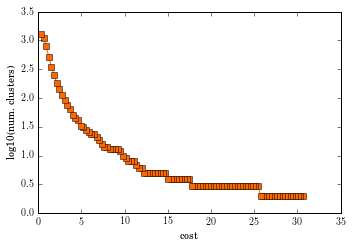

In [247]:
x = np.linspace(8000,1000,num=100)
x = np.linspace(1500,100,num=100)
x = np.linspace(fit[-1][2]-fit[-1][2]/100,fit[-1][2]/100,num=100)
y = np.zeros([100,1])
for i,cost in enumerate(x):
    ind,nc,cs = get_cluster_indices(fit,threshold=cost)
    y[i] = nc
fig = plt.figure()
ax = fig.add_axes([.2,.2,.7,.7])
ax.plot(x,np.log10(y),'s-',color='#ff6700')
ax.set_ylabel('log10(num. clusters)')
ax.set_xlabel('cost')
# mysavefig('heirarchal-clustering-cost.svg')

/Users/andyreagan/projects/2014/09-books/pyvenv/lib/python3.5/site-packages/ipykernel/__main__.py:9: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future




2220 [  27 1312 1321]
2568 [  29  366  374  414  430  435  455  475  497  502  579  599  774  784  822
  833 1032 1166 1305]
2592 [  65   70   81   84  139  148  203  325  446  532  613  658  666  670  706
  768  814  853  926 1013 1021 1022 1031 1060 1076 1184 1212 1221 1225 1309]
2511 [  22  118  209  340  354  361  437  561  855 1020 1037 1046 1089 1150 1313]
2554 [  20  133  363  419  505  529  633  699  817  953  992 1038 1088 1141]
2588 [   7   23   47   60   86  108  116  117  178  197  282  284  348  351  373
  378  379  441  442  540  566  586  665  692  711  714  755  796  803  813
  815  830  837  906  930  932  954  962  965 1055 1173 1181 1209 1260 1294
 1298 1310 1325]
2447 [ 256  341  458  893  971 1129 1165]
2460 [  75  283  695  861  950 1119 1143]
2556 [ 88 162 346 657 742]
2531 [  26   93  144  157  169  263  266  326  377  765  874  915 1070 1207 1215
 1316]
2535 [ 128  184  257  258  264  349  369  371  399  411  448  464  490  571  575
  609  642  645  649  674  7

/Users/andyreagan/projects/2014/09-books/pyvenv/lib/python3.5/site-packages/numpy/core/_methods.py:59: RuntimeWarning: Mean of empty slice.
  warnings.warn("Mean of empty slice.", RuntimeWarning)

  warnings.warn("Mean of empty slice.", RuntimeWarning)

/Users/andyreagan/projects/2014/09-books/pyvenv/lib/python3.5/site-packages/numpy/core/_methods.py:70: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)

  ret = ret.dtype.type(ret / rcount)



 [ 305  330  364  391  544  702  750  756  873 1131 1155]
2547 [  21   31   90  204  252  522  526  652  771  834  922 1018 1047 1115 1303]
1223 [1223]
2505 [  52  323  433  470  486  739  966 1063 1148 1249]
2552 [  13  127  189  268  466  473  493  598  678  723  770  900  970 1002 1033
 1154 1185]
2572 [   3    5   51   58   68  208  292  293  294  320  370  382  386  476  515
  549  585  607  623  629  720  845  871  901  936  960 1053 1116 1227 1229]
1876 [4 6]
2567 [ 109  226  232  265  389  401  733  746  754  851  884  983 1010 1127 1174
 1238 1288]
2569 [  79  103  154  247  308  428  443  577  580  651  767  775  955  956 1075
 1082 1091 1187 1226 1237 1252 1257]
2591 [  36   64   89   91  110  119  163  174  210  239  246  251  316  344  357
  421  439  472  494  530  547  550  581  606  611  619  685  732  752  821
  842  951  972  981  990 1000 1065 1102 1113 1128 1135 1159 1200 1240 1326]
511 [511]
2499 [  39  114  180  438  545  625  641  824  844  870  902 1027 1136 116

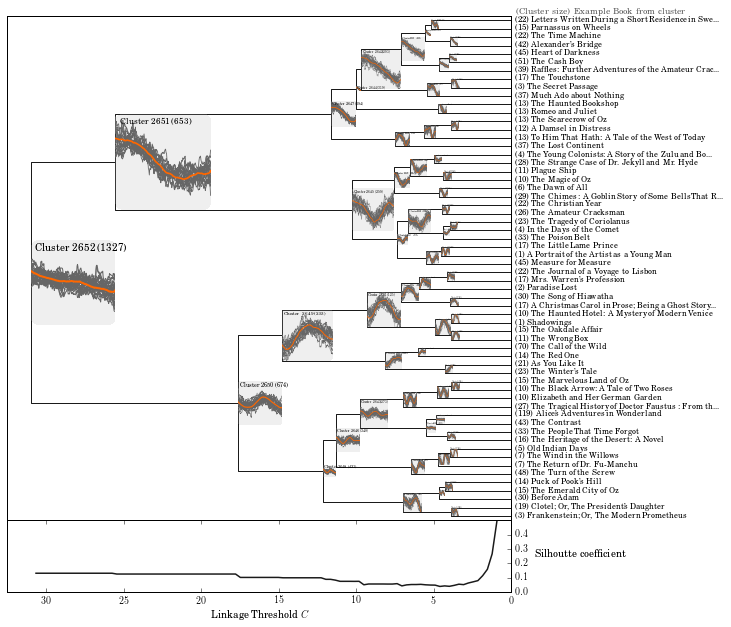

In [289]:
def printcolor(k,yes='yes',fit=fit):
    # print('node {0} index {1}'.format(k-fit.shape[0],k-fit.shape[0]-1))
    return rgb2hex(cm(fit[k-fit.shape[0]-1,2]/fit[-1,2]))

def llf(k):
    chars = 50
    all_ind = get_cluster_indices_from_id(fit,k)
    print(k,all_ind)
    avg_distances = [np.mean([distances[ij_in_cdm(i,j)] for j in all_ind if j != i]) for i in all_ind]    
    indices_sorted = sorted(range(len(all_ind)),key=lambda i: avg_distances[i],reverse=False)
    all_ind_sorted = all_ind[indices_sorted]
    if len(all_ind_sorted) == 0:
        print("no book found?")
        print(k)
    b = q[int(all_ind_sorted[0])]
    # b = q[627]
    if len(b.title) > chars:
        s = "({}) {}...".format(len(all_ind),b.title[:chars-3].replace("\n",": ").replace("&","\&"))
    else:
        s = "({}) {}".format(len(all_ind),b.title.replace("\n",": ").replace("&","\&"))
    # print('node {0} index {1}'.format(k-fit.shape[0],k-fit.shape[0]-1))
    s = s.encode("ascii","ignore").decode("ascii")
    return s
    

# R = dendrogram(fit,
#                p=p,
#                truncate_mode='lastp',
#                link_color_func=lambda k: printcolor(k,yes='n'),
#                ax=ax,
#                # leaf_rotation=0.,
#                # labels=alltitles,
#                # leaf_label_func=llf,
#                # leaf_label_func=lambda k: q[k].title,
#                # orientation='right',
#                orientation='top',
#                # no_labels=True,
#                )

p=60
fig = plt.figure(figsize=(10,10))
ax = fig.add_axes([.2,.2,.7,.7])
# ax.set_xscale('log',basex=10)
# ax.set_xlim([50,10000])
# ax.set_xlim(np.log10([50,10000]))
# colors = ["k" for i in range(p+1)]
R = dendrogram(fit,
               p=p,
               link_color_func=lambda k: "0.1",
               truncate_mode="lastp",
               orientation="left",
               distance_sort="ascending",
               ax=ax,
               # leaf_label_func=lambda k: k-fit.shape[0]+1,
               leaf_label_func=llf,
               leaf_font_size=8,
               # link_color_func=lambda k: colors[k],
               # annotate_above=10000,
               )

y_range = ax.get_ylim()
def add_line(x,i):
    ax.plot([x,x],y_range,zorder=1,color=".9",linewidth=2)
    # example from mpl
#     bbox_props = dict(boxstyle="rarrow,pad=0.3", fc="cyan", ec="b", lw=2)
#     t = ax.text(0, 0, "Direction", ha="center", va="center", rotation=45,
#             size=15,
#             bbox=bbox_props)
    bbox_props = dict(boxstyle="square,pad=0.3", fc=".9", ec=".6", lw=1)
    ax.text(x+fit[-1][2]/100,y_range[1]-8,"{}".format(i),color=".1",ha="right",va="top",linespacing=1.8,size=10) # ,bbox=bbox_props)
# thresholds = [29000,20000,11000,5500]
ax.text(-fit[-1][2]/100,y_range[1]+3,"(Cluster size) Example Book from cluster",color=".4",size=9)

for i,d,c in zip(R['icoord'],R['dcoord'],R['leaves']):
    y = 0.5 * sum(i[1:3])
    # print(i)
    x = d[1]
#     print(d)
#     print(i)
    # print(x,y)
    # ax.plot(y,x, 'ro')
#     plt.annotate("%.3g" % y, (x, y), xytext=(0, -8),
#                  textcoords='offset points',
#                  va='top', ha='center')
    if x>0:
        # ax.text(x-30,y,c,color="0",ha="left",va="top",linespacing=1.8,size=10)
        
        # subx = fig.add_axes([ax.transLimits.transform_point([d[1],i[0]])[0],
        #                      ax.transLimits.transform_point([d[1],i[0]])[1],
        #                      ax.transLimits.transform_point([d[0],i[1]])[0],
        #                      ax.transLimits.transform_point([d[0],i[1]])[0]])
        
        rects = [ax.get_xlim()[0]-np.min([d[1]-d[0],d[2]-d[3]]),i[2]-i[1]]
        rects_notflipped = [np.min([d[1]-d[0],d[2]-d[3]]),i[2]-i[1]]
        # print(rects)
        max_size_ax = ax.transLimits.transform_point(rects)
        # max_size_ax[0] = 1-max_size_ax
        # print(max_size_ax)
        max_size_ax = np.min(max_size_ax)
        b_left = np.array([x,y])
        b_ax = ax.transLimits.transform_point(b_left)+np.array([0,-max_size_ax/2])
        # b_ax[0] += .1*max_size_ax
        b_ax_subrect = .2+.7*b_ax
        # print(max_size_ax)
        # print(b_ax)
        subx = fig.add_axes([b_ax_subrect[0],b_ax_subrect[1],max_size_ax*.7,max_size_ax*.7],frameon=False)
        r = FancyBboxPatch((0,0),1,1,transform=subx.transAxes,fill=True,edgecolor=None,facecolor=".7",linewidth=0.0,
                      alpha=.2,boxstyle="round,pad=0.0,rounding_size=.1",antialiased=False)
        subx.add_patch(r)
        # subx.plot()
        this_cluster_id = get_cluster_from_t(x)
        print("adding plot for cluster ",this_cluster_id)
        ind = get_cluster_indices_from_id(fit,this_cluster_id)
        # print(ind)
        ind_sorted,titles_sorted = get_sorted(ind)
        j = 0
        for index in ind_sorted:
            if j+1 > 20:
                break
            # ax1.plot(data[index],label="{} ({})".format(title.encode("ascii","ignore").decode("ascii"),q[int(index)].gutenberg_id))
            subx.plot(data[index],color=".4",label=None,linewidth=x/fit[-1][2])
            # ax1books.text(0.0,.8-j*.2,"{} ({})".format(title.encode("ascii","ignore").decode("ascii"),q[int(index)].gutenberg_id),fontsize=10)
            j+=1
        subx.plot(data[ind,:].mean(axis=0),
                 color="#ff6700",
                 linewidth=x*2/fit[-1][2],
                 label="Cluster {} ({})".format(this_cluster_id,len(ind)))
        subx.text(.05,.95,"Cluster {} ({})".format(this_cluster_id,len(ind)),
                  color="0",ha="left",va="top",
                  # linespacing=1.8,
                  size=x*10/fit[-1][2],
                  transform=subx.transAxes)
        subx.set_xticks([])
        subx.set_yticks([])
        subx.set_ylim(np.array([-1,1])*subplot_ylim)
    # print("="*40)
        

# subx = fig.add_axes([.2,.5,.1,.1])

# thresholds = [5800,4000,2800]
# nc = [2,4,6]
# for i,t in enumerate(thresholds):
#     # add_line(t,i)
#     # add_line(t,"$C_{1} = {0}$\n{1} Clusters".format(t,nc[i]))
#     add_line(t,"$C_{1} = {0}$".format(t,nc[i]))

mysavefig("dendrogram-left-p{}-topstories.pdf".format(p),openfig=True,date_prefix=True,folder=this_dir)

# ax.set_xlim(np.log10([50,10000]))
# ax.set_xlim([400,11000])
ax.set_xticks([])
ax2 = fig.add_axes([.2,.1,.7,.1])
ax2.plot(sil_x,sil_vals,'.1',linewidth=1.5)
ax2.set_xlim(ax.get_xlim())
ax2.yaxis.tick_right()
# ax2.set_ylim([0,1])
# ax2.set_yticks([0,.2,.4,.6,.8])
ax2.set_ylim([0,.5])
ax2.set_yticks([0,.1,.2,.3,.4])
# ax2.set_ylabel("Silhoutte coefficient")
ax2.text(-fit[-1][2]/20,.25,"Silhoutte coefficient")
ax2.set_xlabel("Linkage Threshold $C$")
mysavefig("dendrogram-left-p{}-topstories-wsilhoutte.pdf".format(p),openfig=True,date_prefix=True,folder=this_dir)

In [290]:
# now let's also plot them
def plot_clusters(clusters,data,cluster_ids,v=False,fix_ylim=True,xspacing=.01,investigate=False):
    # we are going to make plots of max width 3
    num_x = np.min([3,len(clusters)])
    num_y = np.ceil(len(clusters)/num_x)
    xspacing = .03
    yspacing = .03
    xoffset = .07
    yoffset = .07
    xwidth = (1.-xoffset)/(num_x)-xspacing
    yheight = (1.-yoffset)/(num_y)-yspacing
    print('xwidth is {0}'.format(xwidth))
    print('yheight is {0}'.format(yheight))
    
    # go compute the ybounds:
    calc_ylim = [100.0,-100.0]
    for cluster in clusters:
        c_max = data[cluster[0][:20],:].max()
        c_min = data[cluster[0][:20],:].min()
        calc_ylim[0] = np.min([calc_ylim[0],c_min])
        calc_ylim[1] = np.max([calc_ylim[1],c_max])
        
    chars = 60
    
    scale_factor_x = 5
    scale_factor_y = 5*1.25
    if investigate:
        scale_factor_x = 10
        scale_factor_y = 10*1.25
    fig = plt.figure(figsize=(scale_factor_x*num_x,scale_factor_y*num_y))
    for i,cluster in enumerate(clusters):
        print(i)
        print("====")
        # print((i-i%num_x))
        # ind = np.argsort(w[:,sv+svstart])[-20:]
        ax1rect = [xoffset+(i%num_x)*(xspacing+xwidth),1.-yheight-yspacing-(int(np.floor((i-i%num_x)/num_x))*(yspacing+yheight))+yheight*.2,xwidth,yheight*.8]
        ax1 = fig.add_axes(ax1rect)
        ax1books_rect = ax1rect.copy()
        ax1books_rect[1] -= yheight*.2
        ax1books_rect[3] = yheight*.2
        ax1books = fig.add_axes(ax1books_rect)
        # ax1books.text?
        # ax.set_title('20 closest positive correlates')
        
        if v:
            print('-'*80)
            print('20 closest positive correlates:')
            # print(cluster)
        j=0
        for index,title in zip(*cluster):
            if j+1 > 20:
                break
            if investigate:
                ax1.plot(data[index],
                         label=tex_escape("{} ({})".format(title.encode("ascii","ignore").decode("ascii"),
                                                                       q[int(index)].gutenberg_id)))
            else:
                ax1.plot(data[index],color=".4",label=None)
            # plt.plot(big_matrix_mean0[i],color=".4")
            if v:
                print(index,title)
            if j<5:
                ax1books.text(0.0,.8-j*.2,
                              tex_escape("{} ({})".format(title.encode("ascii","ignore").decode("ascii"),
                                                                      q[int(index)].gutenberg_id)),
                              fontsize=10)
            j+=1
        ax1.plot(data[cluster[0],:].mean(axis=0),color="#ff6700",linewidth=2,label="Cluster {} ({})".format(cluster_ids[i],len(cluster[0])))
        # ax1.set_xticklabels([])
        ax1.legend(loc="upper right")

        # ax1.axis('off')
        ax1books.axis('off')
        
        props = dict(boxstyle='square', facecolor='white', alpha=1.0)
        # fig.text(ax1rect[0]+.03/xwidth, ax1rect[1]+ax1rect[3]-.03/yheight, letters[i],
        if fix_ylim:
            my_ylim = calc_ylim
        else:
            my_ylim = ax1.get_ylim()
        ax1.text(.035*200, my_ylim[0]+.965*(my_ylim[1]-my_ylim[0]), letters[i],
                     fontsize=14,
                     verticalalignment='top',
                     horizontalalignment='left',
                     bbox=props)

        if fix_ylim:
            ax1.set_ylim(calc_ylim)
        if fix_ylim and i%num_x > 0:
            ax1.set_yticklabels([])
        if True: # i<num_x*(num_y-1): # only on the bottom row
            ax1.set_xticklabels([])
            
    mysavefig("clustered-timeseries-nclusters-{}.pdf".format(len(clusters)),
              folder=this_dir,
              openfig=False)

xwidth is 0.8999999999999999
yheight is 0.8999999999999999
0
====
xwidth is 0.43499999999999994
yheight is 0.8999999999999999
0
====
1
====
xwidth is 0.28
yheight is 0.8999999999999999
0
====
1
====
2
====
xwidth is 0.28
yheight is 0.43499999999999994
0
====
1
====
2
====
3
====
xwidth is 0.28
yheight is 0.43499999999999994
0
====
1
====
2
====
3
====
4
====
xwidth is 0.28
yheight is 0.43499999999999994
0
====
1
====
2
====
3
====
4
====
5
====
xwidth is 0.28
yheight is 0.28
0
====
1
====
2
====
3
====
4
====
5
====
6
====
xwidth is 0.28
yheight is 0.28
0
====
1
====
2
====
3
====
4
====
5
====
6
====
7
====
xwidth is 0.28
yheight is 0.28
0
====
1
====
2
====
3
====
4
====
5
====
6
====
7
====
8
====
xwidth is 0.28
yheight is 0.20249999999999999
0
====
1
====
2
====
3
====
4
====
5
====
6
====
7
====
8
====
9
====
xwidth is 0.28
yheight is 0.20249999999999999
0
====
1
====
2
====
3
====
4
====
5
====
6
====
7
====
8
====
9
====
10
====
xwidth is 0.28
yheight is 0.20249999999999999
0
==

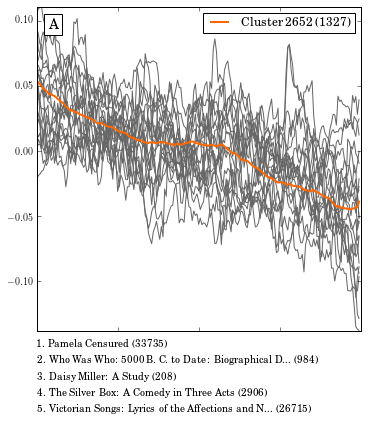

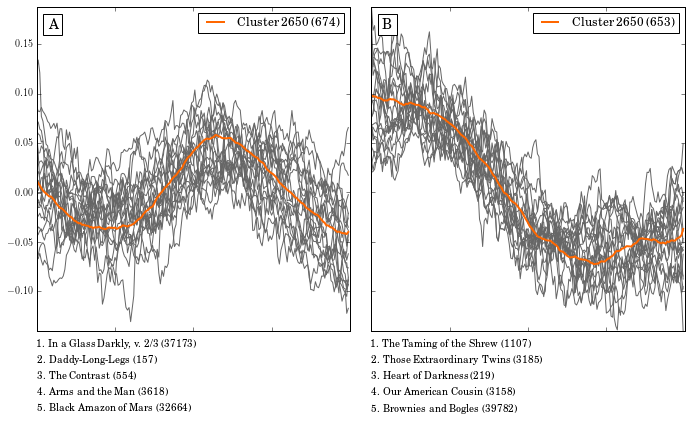

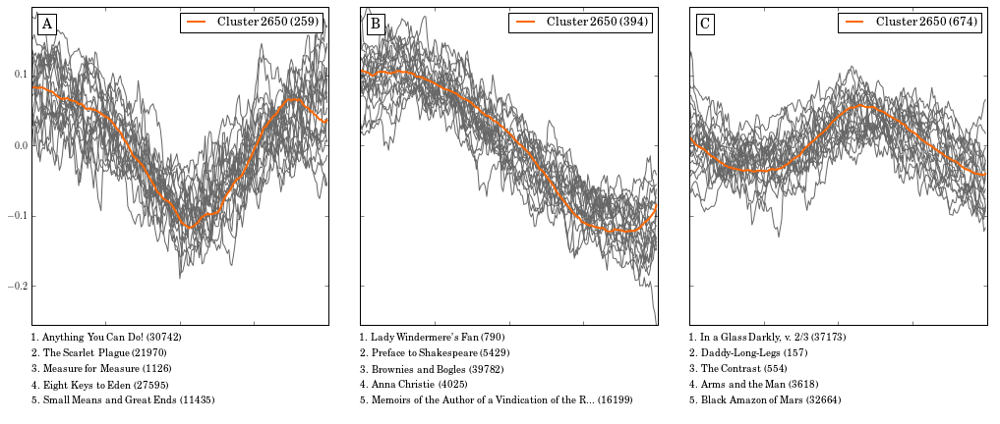

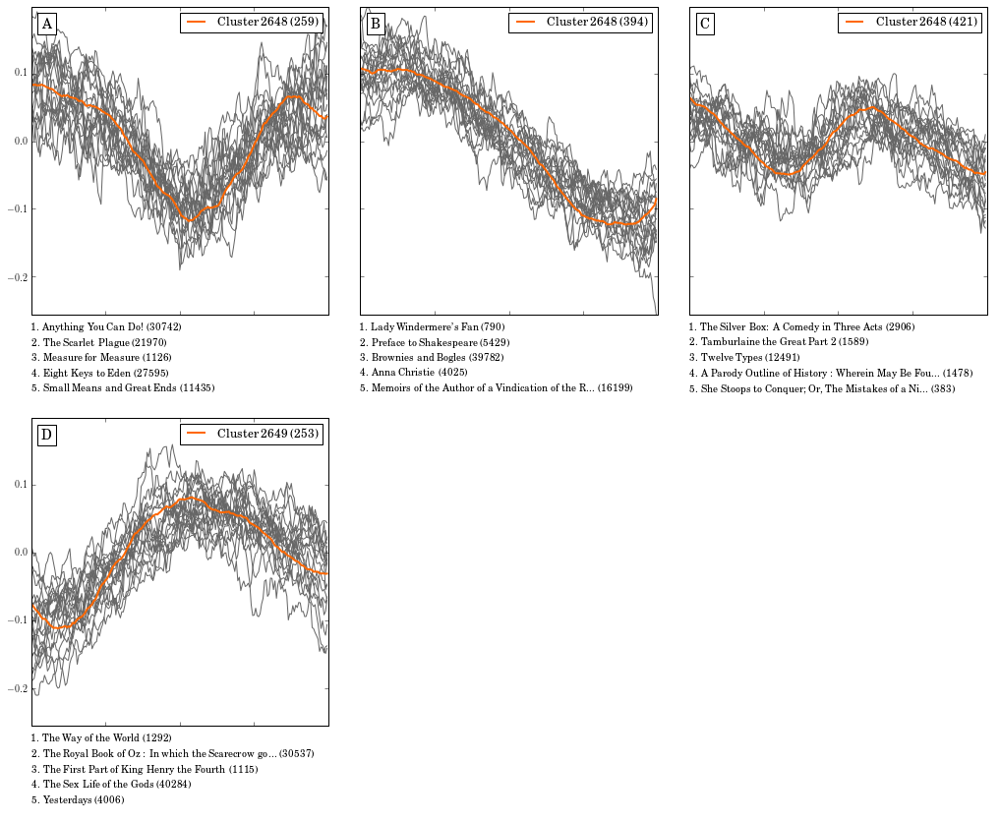

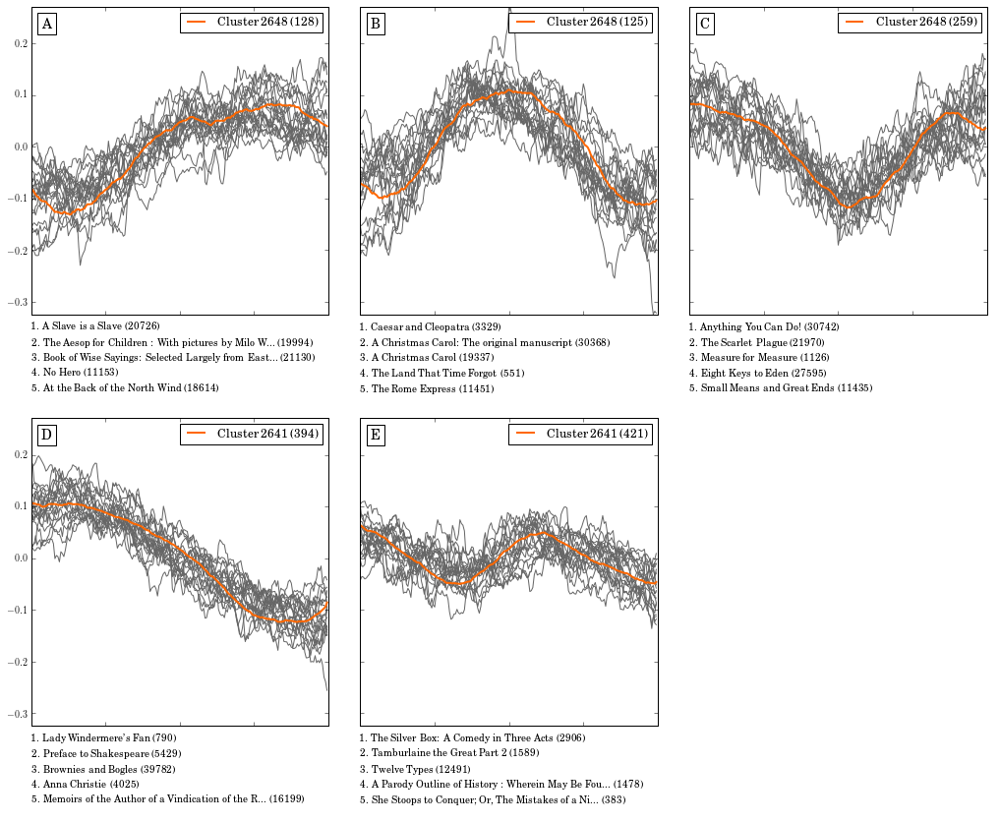

...

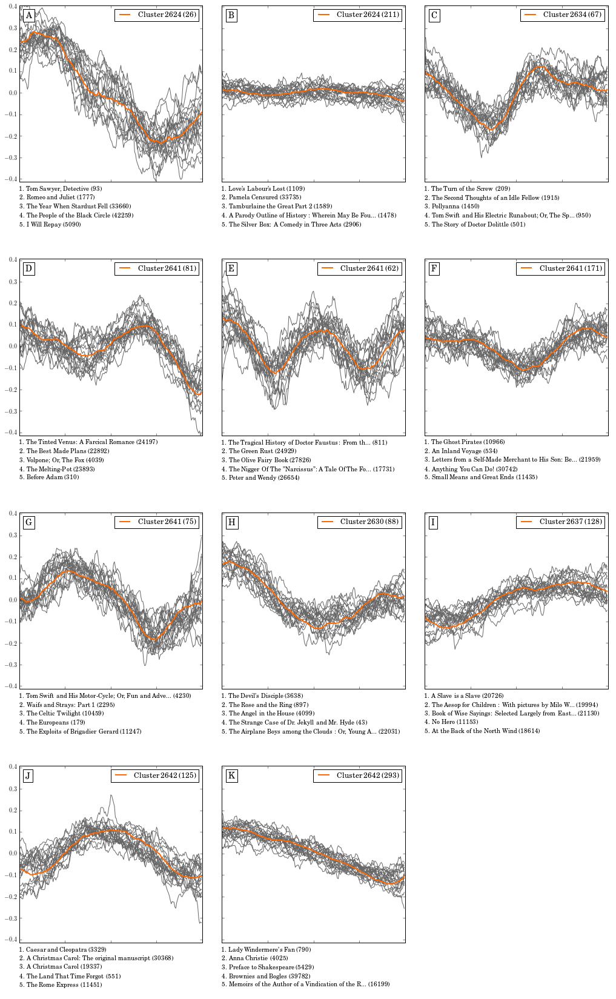

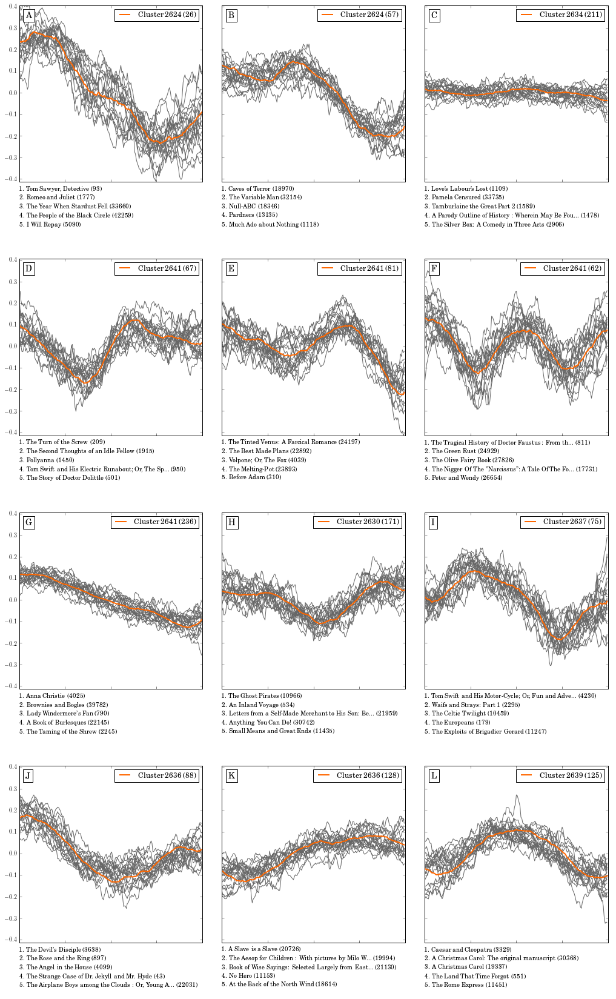

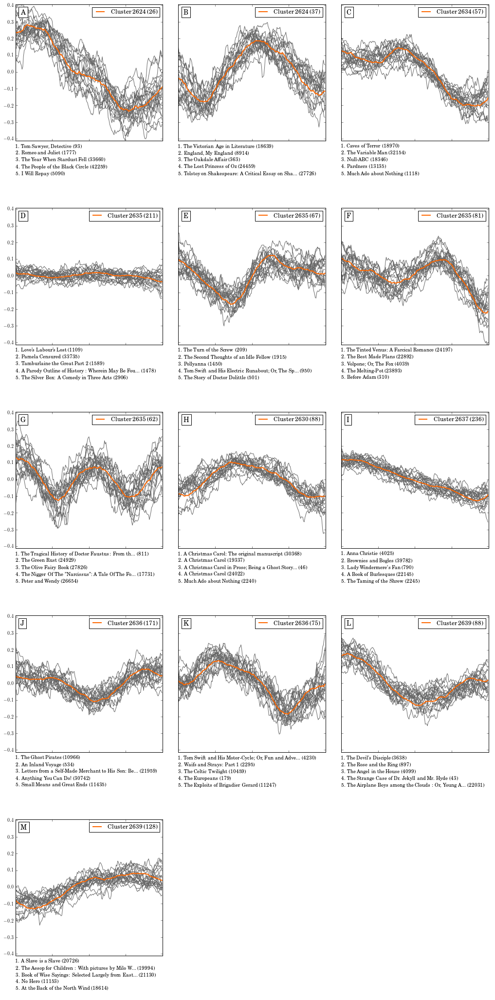

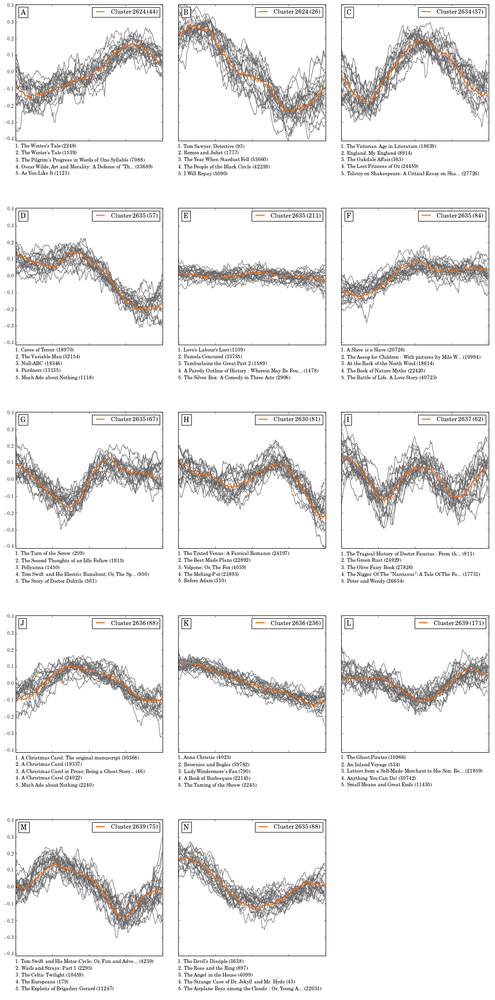

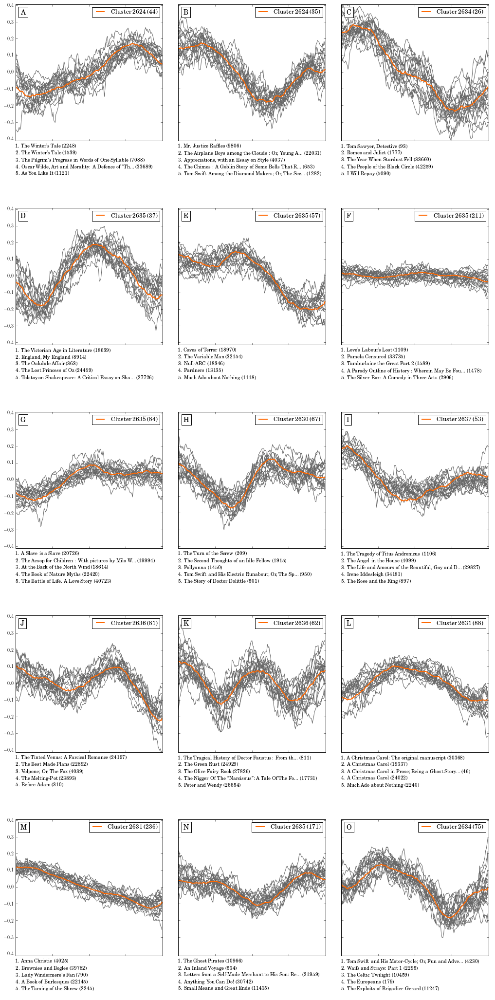

In [291]:
for i in range(15):
    t = find_threshold(i+1)
    # add_line(t,i)
    ind,cluster_list = get_cluster_indices2(fit,threshold=t)
    # ind,nc,cs = get_cluster_indices(fit,threshold=t)
    # print(ind)
    # the indices...
    # print(cluster_list)
    # for each story, which cluster it is in, by id (a reverse lookup of ind)
    ind_sorted,titles_sorted = get_sorted(ind[0])
    # print(ind_sorted[:10])
    # print(titles_sorted[:10])
    
    # go and sort all of them
    ind_sorted_all = [get_sorted(j) for j in ind]
    # print(ind_sorted_all)
    
    # now let's try our new plotting function
    plot_clusters(ind_sorted_all,data,cluster_list) #,fix_ylim=[5.5,5.8]) 

In [251]:
def sil_plot_nc(n_clusters):
    t = find_threshold(n_clusters)
    # print(t)
    cluster_labels = get_cluster_indices3(fit,t)
    # silhouette_avg = metrics.silhouette_score(allDistancesCentered, cluster_labels)
    # sample_silhouette_values = metrics.silhouette_samples(allDistancesCentered, cluster_labels)
    sample_silhouette_values = metrics.silhouette_samples(squareform(distances),cluster_labels,metric="precomputed")
    silhouette_avg = np.mean(sample_silhouette_values)
    y_lower = 10
    n_clusters = len(np.unique(cluster_labels))
    fig = plt.figure(figsize=(4,6))
    ax1 = fig.add_axes([.2,.2,.7,.7])
    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, data.shape[0] + (n_clusters + 1) * 10])
    cluster_labels_uniq = np.unique(cluster_labels)
    cluster_labels_uniq.sort()
    for i,c in enumerate(cluster_labels_uniq):
        # print(c)
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == c]
        # print(len(sample_silhouette_values[cluster_labels == c]))

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        # color = cm.spectral(float(i) / n_clusters)
        color=".5"
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.09, y_lower + 0.5 * size_cluster_i, str(c))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("Silhouette plot for the $N={}$ clusters.".format(n_clusters))
    ax1.set_xlabel("Silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhoutte score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
    mysavefig("silhouette-distribution-{}.pdf".format(n_clusters),
                  folder=this_dir,
                  openfig=False)

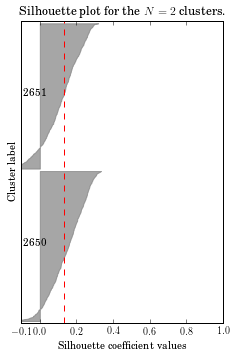

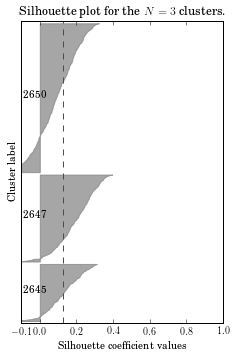

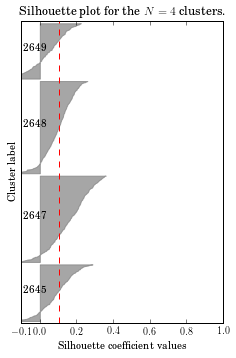

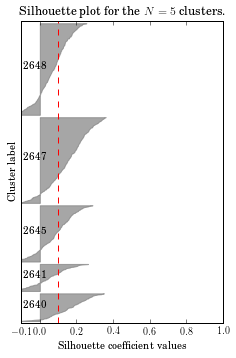

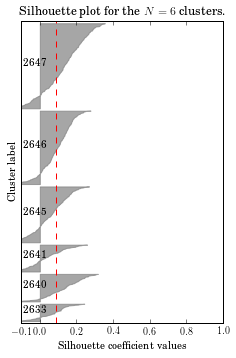

...

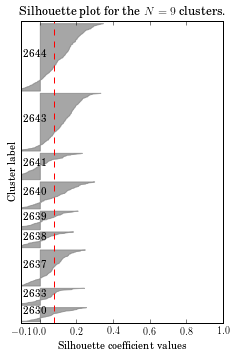

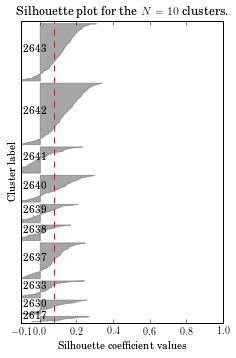

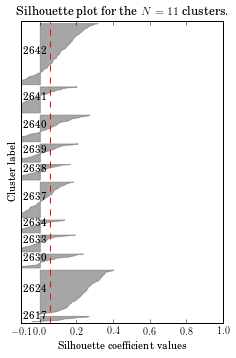

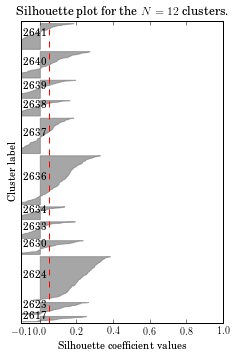

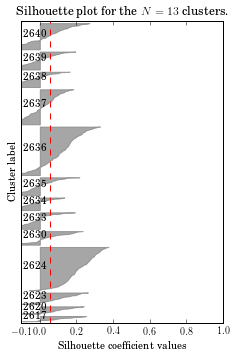

In [252]:
for i in range(12):
    sil_plot_nc(i+2)